# Maps 

Author: Kat Le

Maps for faculty review and final presentations.

In [2]:
# Load packages 
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn
from matplotlib import colors
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from matplotlib.colors import LinearSegmentedColormap, BoundaryNorm

In [3]:
# Read in GeoJSON of all 
national_results = gpd.read_file('/capstone/justice40/data/national_results.geojson')
national_results.head()

# Read in GeoJSON of all 
state_polygons = gpd.read_file('/capstone/justice40/data/state_polygons/state_polygons.shp')
state_polygons.head()

,STATEFP,STATENS,AFFGEOID,GEOID,STUSPS,NAME,LSAD,ALAND,AWATER,geometry
0,24,01714934,0400000US24,24,MD,Maryland,00,25151100280,6979966958,"MULTIPOLYGON (((-76.04621 38.02553, -76.00734 ..."
1,19,01779785,0400000US19,19,IA,Iowa,00,144661267977,1084180812,"POLYGON ((-96.62187 42.77925, -96.57794 42.827..."
2,10,01779781,0400000US10,10,DE,Delaware,00,5045925646,1399985648,"POLYGON ((-75.77379 39.72220, -75.75323 39.757..."
3,39,01085497,0400000US39,39,OH,Ohio,00,105828882568,10268850702,"MULTIPOLYGON (((-82.86334 41.69369, -82.82572 ..."
4,42,01779798,0400000US42,42,PA,Pennsylvania,00,115884442321,3394589990,"POLYGON ((-80.51989 40.90666, -80.51964 40.987..."


# Total Indicators by Census Tract

Hawaii data count: 326


/tmp/ipykernel_795903/2727050844.py:44: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('rocket_r')


Error zooming to Hawaii centroid: positional indexers are out-of-bounds
Falling back to standard extent...


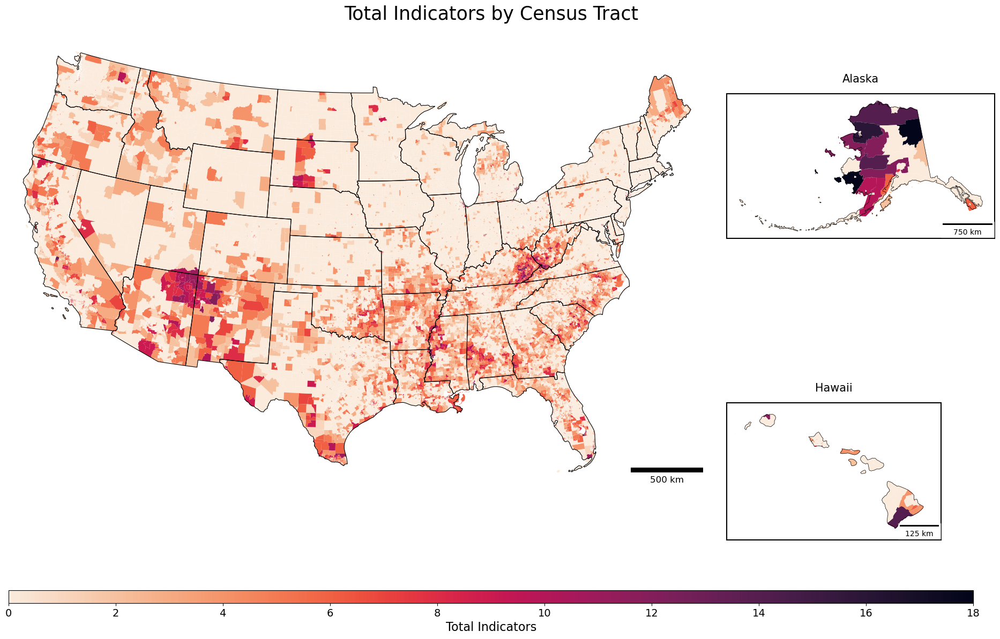

In [ ]:
def create_national_map(gdf, state_gdf):
    # Import scalebar
    from matplotlib_scalebar.scalebar import ScaleBar
    
    # Create figure with transparent background
    fig = plt.figure(figsize=(20, 12), facecolor='none')
    
    # CONUS takes up most of the left and central area
    ax_main = plt.axes([0.05, 0.15, 0.65, 0.8])
    
    # Alaska at top right (similar size to original)
    ax_ak = plt.axes([0.72, 0.5, 0.25, 0.4])
    
    # Hawaii at bottom right (similar size to original)
    ax_hi = plt.axes([0.72, 0.1, 0.2, 0.25])  # Using original dimensions
    
    # Explicit FIPS code filtering to exclude Puerto Rico (72)
    conus_fips = [str(i).zfill(2) for i in range(1, 57)]
    conus_fips = [x for x in conus_fips if x not in ['02', '15', '72']]
    
    # Filter and project data
    gdf_conus = gdf[~(gdf['tract_id'] // 1000000000).isin([2, 15, 72])].copy()
    gdf_conus = gdf_conus.to_crs('EPSG:5070')
    state_conus = state_gdf[state_gdf['STATEFP'].isin(conus_fips)].to_crs('EPSG:5070')
    
    # Filter and project Alaska with Alaska Albers projection
    gdf_ak = gdf[gdf['tract_id'] // 1000000000 == 2].to_crs('EPSG:3338')
    state_ak = state_gdf[state_gdf['STATEFP'] == '02'].to_crs('EPSG:3338')
    
    # Filter and project Hawaii 
    gdf_hi = gdf[gdf['tract_id'] // 1000000000 == 15].copy()
    state_hi = state_gdf[state_gdf['STATEFP'] == '15'].copy()
    
    # Debug - Check if Hawaii data exists
    print(f"Hawaii data count: {len(gdf_hi)}")
    
    # Project Hawaii data
    if not gdf_hi.empty:
        gdf_hi = gdf_hi.to_crs('EPSG:3750')
    if not state_hi.empty:
        state_hi = state_hi.to_crs('EPSG:3750')
    
    # Use rocket colormap from viridis but reversed
    cmap = plt.cm.get_cmap('rocket_r')
    
    # Set all axes to have transparent backgrounds
    ax_main.patch.set_alpha(0)
    ax_ak.patch.set_alpha(0)
    ax_hi.patch.set_alpha(0)
    
    # Plot regions
    state_conus.boundary.plot(ax=ax_main, color='black', linewidth=0.8)
    main_plot = gdf_conus.plot(ax=ax_main, column='total_criteria', 
                              cmap=cmap, legend=False)
    
    # Set the extent for CONUS to zoom in but show all states
    ax_main.set_xlim(state_conus.total_bounds[0] - 1e5, state_conus.total_bounds[2] + 1e5)
    ax_main.set_ylim(state_conus.total_bounds[1] - 1e5, state_conus.total_bounds[3] + 1e5)
    
    # Add scalebar for CONUS (EPSG:5070 uses meters)
    scalebar_conus = ScaleBar(1, dimension='si-length', units='m', 
                             location='lower right', 
                             box_alpha=0.5,
                             length_fraction=0.15,
                             font_properties={'size': 12})
    ax_main.add_artist(scalebar_conus)
    
    # Remove border around main map
    for spine in ax_main.spines.values():
        spine.set_visible(False)
    
    # Plot Alaska
    state_ak.boundary.plot(ax=ax_ak, color='black', linewidth=0.5)
    ak_plot = gdf_ak.plot(ax=ax_ak, column='total_criteria', 
                         cmap=cmap, legend=False)
    ax_ak.set_title('Alaska', pad=15, size=15)
    
    # Add scalebar for Alaska (EPSG:3338 uses meters)
    scalebar_ak = ScaleBar(1, dimension='si-length', units='m', 
                          location='lower right', 
                          box_alpha=0.5,
                          length_fraction=0.2,
                          font_properties={'size': 10})
    ax_ak.add_artist(scalebar_ak)
    
    # Add border around Alaska inset
    for spine in ax_ak.spines.values():
        spine.set_visible(True)
        spine.set_linewidth(1.5)
        spine.set_edgecolor('black')
    
    # Plot Hawaii - Check if the GeoDataFrame is not empty first
    if not gdf_hi.empty and not state_hi.empty:
        # Plot state boundaries
        state_hi.boundary.plot(ax=ax_hi, color='black', linewidth=0.5)
        
        # Plot the tract data
        hi_plot = gdf_hi.plot(ax=ax_hi, column='total_criteria', 
                             cmap=cmap, legend=False)
        
        # Add scalebar for Hawaii (EPSG:3750 uses meters)
        scalebar_hi = ScaleBar(1, dimension='si-length', units='m', 
                              location='lower right', 
                              box_alpha=0.5,
                              length_fraction=0.2,
                              font_properties={'size': 10})
        ax_hi.add_artist(scalebar_hi)
        
        # Zoom in on the main Hawaiian island (Oahu, where Honolulu is)
        # Find Big Island or Oahu, which should have the largest area
        try:
            # First attempt: find the largest island by area
            largest_island_idx = state_hi.area.idxmax()
            main_island = state_hi.iloc[[largest_island_idx]]
            
            # Get the centroid of the main island
            centroid = main_island.centroid.iloc[0]
            
            # Zoom to 70% of the island's extent
            x_range = main_island.total_bounds[2] - main_island.total_bounds[0]
            y_range = main_island.total_bounds[3] - main_island.total_bounds[1]
            zoom_factor = 1.5  # Zoom level (higher number = more zoomed in)
            
            ax_hi.set_xlim(centroid.x - x_range/zoom_factor, centroid.x + x_range/zoom_factor)
            ax_hi.set_ylim(centroid.y - y_range/zoom_factor, centroid.y + y_range/zoom_factor)
            
            print(f"Zoomed to centroid: ({centroid.x}, {centroid.y})")
        except Exception as e:
            print(f"Error zooming to Hawaii centroid: {e}")
            print("Falling back to standard extent...")
            
            # Fallback: just use the bounds of all Hawaii data
            buffer_factor = 0.1  # Provide some buffer around the islands
            x_range = state_hi.total_bounds[2] - state_hi.total_bounds[0]
            y_range = state_hi.total_bounds[3] - state_hi.total_bounds[1]
            
            ax_hi.set_xlim(state_hi.total_bounds[0] - x_range * buffer_factor,
                          state_hi.total_bounds[2] + x_range * buffer_factor)
            ax_hi.set_ylim(state_hi.total_bounds[1] - y_range * buffer_factor,
                          state_hi.total_bounds[3] + y_range * buffer_factor)
    else:
        # If Hawaii data is empty, just display a message
        ax_hi.text(0.5, 0.5, "No data available for Hawaii", 
                  ha='center', va='center', fontsize=12)
    
    ax_hi.set_title('Hawaii', pad=15, size=15)
    
    # Add border around Hawaii inset regardless
    for spine in ax_hi.spines.values():
        spine.set_visible(True)
        spine.set_linewidth(1.5)
        spine.set_edgecolor('black')
    
    # Remove tick labels but keep borders
    for ax in [ax_main, ax_ak, ax_hi]:
        ax.set_xticks([])
        ax.set_yticks([])
    
    # Add horizontal colorbar at the very bottom of the plot
    cax = fig.add_axes([0.05, 0.02, 0.9, 0.02])
    sm = plt.cm.ScalarMappable(cmap=cmap)
    sm.set_array(gdf['total_criteria'])
    cbar = fig.colorbar(sm, cax=cax, orientation='horizontal', 
                        label='Total Criteria')
    
    # Make legend labels larger
    cbar.ax.tick_params(labelsize=14)  # Increase tick label size
    cbar.set_label('Total Indicators', size=16)  # Increase label size
    
    # Main title
    plt.suptitle('Total Indicators by Census Tract', 
                 y=0.95, 
                 fontsize=25)
    
    return fig

# Usage:
fig = create_national_map(national_results, state_polygons)

# Save with transparent background
plt.savefig('img/national_map_indicators.png', dpi=300, bbox_inches='tight', transparent=True)
plt.show()

Hawaii data count: 326


/tmp/ipykernel_795903/2214521398.py:44: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('rocket_r')


Error zooming to Hawaii centroid: positional indexers are out-of-bounds
Falling back to standard extent...


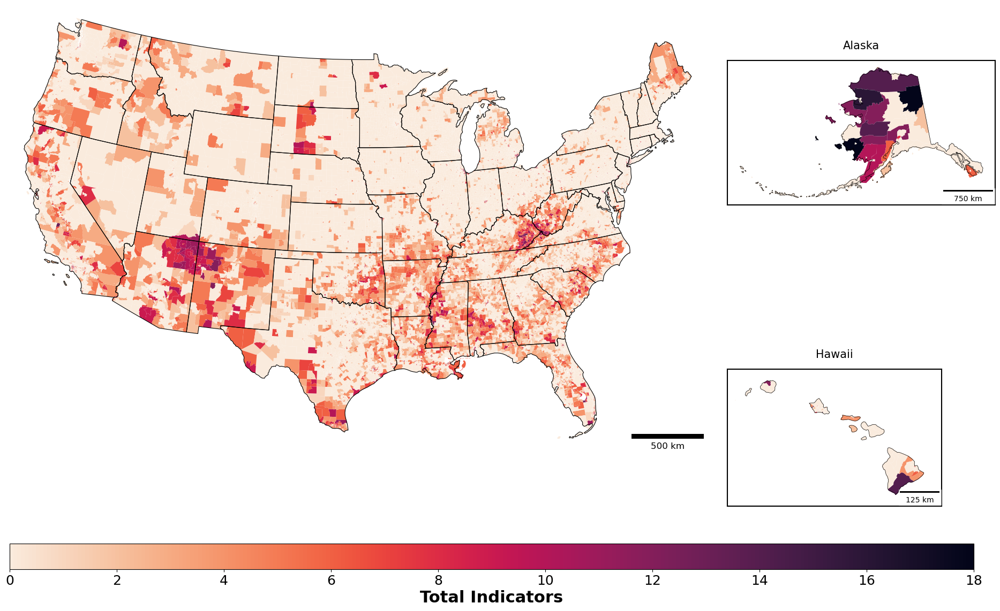

In [ ]:
def create_national_map(gdf, state_gdf):
    # Import scalebar
    from matplotlib_scalebar.scalebar import ScaleBar
    
    # Create figure with transparent background
    fig = plt.figure(figsize=(20, 12), facecolor='none')
    
    # CONUS takes up most of the left and central area
    ax_main = plt.axes([0.05, 0.15, 0.65, 0.8])
    
    # Alaska at top right (similar size to original)
    ax_ak = plt.axes([0.72, 0.5, 0.25, 0.4])
    
    # Hawaii at bottom right (similar size to original)
    ax_hi = plt.axes([0.72, 0.1, 0.2, 0.25])  # Using original dimensions
    
    # Explicit FIPS code filtering to exclude Puerto Rico (72)
    conus_fips = [str(i).zfill(2) for i in range(1, 57)]
    conus_fips = [x for x in conus_fips if x not in ['02', '15', '72']]
    
    # Filter and project data
    gdf_conus = gdf[~(gdf['tract_id'] // 1000000000).isin([2, 15, 72])].copy()
    gdf_conus = gdf_conus.to_crs('EPSG:5070')
    state_conus = state_gdf[state_gdf['STATEFP'].isin(conus_fips)].to_crs('EPSG:5070')
    
    # Filter and project Alaska with Alaska Albers projection
    gdf_ak = gdf[gdf['tract_id'] // 1000000000 == 2].to_crs('EPSG:3338')
    state_ak = state_gdf[state_gdf['STATEFP'] == '02'].to_crs('EPSG:3338')
    
    # Filter and project Hawaii 
    gdf_hi = gdf[gdf['tract_id'] // 1000000000 == 15].copy()
    state_hi = state_gdf[state_gdf['STATEFP'] == '15'].copy()
    
    # Debug - Check if Hawaii data exists
    print(f"Hawaii data count: {len(gdf_hi)}")
    
    # Project Hawaii data
    if not gdf_hi.empty:
        gdf_hi = gdf_hi.to_crs('EPSG:3750')
    if not state_hi.empty:
        state_hi = state_hi.to_crs('EPSG:3750')
    
    # Use rocket colormap from viridis but reversed
    cmap = plt.cm.get_cmap('rocket_r')
    
    # Set all axes to have transparent backgrounds
    ax_main.patch.set_alpha(0)
    ax_ak.patch.set_alpha(0)
    ax_hi.patch.set_alpha(0)
    
    # Plot regions
    state_conus.boundary.plot(ax=ax_main, color='black', linewidth=0.8)
    main_plot = gdf_conus.plot(ax=ax_main, column='total_criteria', 
                              cmap=cmap, legend=False)
    
    # Set the extent for CONUS to zoom in but show all states
    ax_main.set_xlim(state_conus.total_bounds[0] - 1e5, state_conus.total_bounds[2] + 1e5)
    ax_main.set_ylim(state_conus.total_bounds[1] - 1e5, state_conus.total_bounds[3] + 1e5)
    
    # Add scalebar for CONUS (EPSG:5070 uses meters)
    scalebar_conus = ScaleBar(1, dimension='si-length', units='m', 
                             location='lower right', 
                             box_alpha=0.5,
                             length_fraction=0.15,
                             font_properties={'size': 12})
    ax_main.add_artist(scalebar_conus)
    
    # Remove border around main map
    for spine in ax_main.spines.values():
        spine.set_visible(False)
    
    # Plot Alaska
    state_ak.boundary.plot(ax=ax_ak, color='black', linewidth=0.5)
    ak_plot = gdf_ak.plot(ax=ax_ak, column='total_criteria', 
                         cmap=cmap, legend=False)
    ax_ak.set_title('Alaska', pad=15, size=15)
    
    # Add scalebar for Alaska (EPSG:3338 uses meters)
    scalebar_ak = ScaleBar(1, dimension='si-length', units='m', 
                          location='lower right', 
                          box_alpha=0.5,
                          length_fraction=0.2,
                          font_properties={'size': 10})
    ax_ak.add_artist(scalebar_ak)
    
    # Add border around Alaska inset
    for spine in ax_ak.spines.values():
        spine.set_visible(True)
        spine.set_linewidth(1.5)
        spine.set_edgecolor('black')
    
    # Plot Hawaii - Check if the GeoDataFrame is not empty first
    if not gdf_hi.empty and not state_hi.empty:
        # Plot state boundaries
        state_hi.boundary.plot(ax=ax_hi, color='black', linewidth=0.5)
        
        # Plot the tract data
        hi_plot = gdf_hi.plot(ax=ax_hi, column='total_criteria', 
                             cmap=cmap, legend=False)
        
        # Add scalebar for Hawaii (EPSG:3750 uses meters)
        scalebar_hi = ScaleBar(1, dimension='si-length', units='m', 
                              location='lower right', 
                              box_alpha=0.5,
                              length_fraction=0.2,
                              font_properties={'size': 10})
        ax_hi.add_artist(scalebar_hi)
        
        # Zoom in on the main Hawaiian island (Oahu, where Honolulu is)
        # Find Big Island or Oahu, which should have the largest area
        try:
            # First attempt: find the largest island by area
            largest_island_idx = state_hi.area.idxmax()
            main_island = state_hi.iloc[[largest_island_idx]]
            
            # Get the centroid of the main island
            centroid = main_island.centroid.iloc[0]
            
            # Zoom to 70% of the island's extent
            x_range = main_island.total_bounds[2] - main_island.total_bounds[0]
            y_range = main_island.total_bounds[3] - main_island.total_bounds[1]
            zoom_factor = 1.5  # Zoom level (higher number = more zoomed in)
            
            ax_hi.set_xlim(centroid.x - x_range/zoom_factor, centroid.x + x_range/zoom_factor)
            ax_hi.set_ylim(centroid.y - y_range/zoom_factor, centroid.y + y_range/zoom_factor)
            
            print(f"Zoomed to centroid: ({centroid.x}, {centroid.y})")
        except Exception as e:
            print(f"Error zooming to Hawaii centroid: {e}")
            print("Falling back to standard extent...")
            
            # Fallback: just use the bounds of all Hawaii data
            buffer_factor = 0.1  # Provide some buffer around the islands
            x_range = state_hi.total_bounds[2] - state_hi.total_bounds[0]
            y_range = state_hi.total_bounds[3] - state_hi.total_bounds[1]
            
            ax_hi.set_xlim(state_hi.total_bounds[0] - x_range * buffer_factor,
                          state_hi.total_bounds[2] + x_range * buffer_factor)
            ax_hi.set_ylim(state_hi.total_bounds[1] - y_range * buffer_factor,
                          state_hi.total_bounds[3] + y_range * buffer_factor)
    else:
        # If Hawaii data is empty, just display a message
        ax_hi.text(0.5, 0.5, "No data available for Hawaii", 
                  ha='center', va='center', fontsize=12)
    
    ax_hi.set_title('Hawaii', pad=15, size=15)
    
    # Add border around Hawaii inset regardless
    for spine in ax_hi.spines.values():
        spine.set_visible(True)
        spine.set_linewidth(1.5)
        spine.set_edgecolor('black')
    
    # Remove tick labels but keep borders
    for ax in [ax_main, ax_ak, ax_hi]:
        ax.set_xticks([])
        ax.set_yticks([])
    
    # Add horizontal colorbar at the very bottom of the plot
    # MODIFIED: Made the colorbar taller and adjusted position
    cax = fig.add_axes([0.05, 0.02, 0.9, 0.04])  # Increased height from 0.02 to 0.04
    sm = plt.cm.ScalarMappable(cmap=cmap)
    sm.set_array(gdf['total_criteria'])
    cbar = fig.colorbar(sm, cax=cax, orientation='horizontal')
    
    # MODIFIED: Make legend labels significantly larger
    cbar.ax.tick_params(labelsize=18)  # Increased from 14 to 18
    cbar.set_label('Total Indicators', size=22, fontweight='bold')  # Increased from 16 to 22 and made bold

    
    return fig

# Usage:
fig = create_national_map(national_results, state_polygons)

# Save with transparent background
plt.savefig('img/national_map_indicators.png', dpi=300, bbox_inches='tight', transparent=True)
plt.show()

# Total Burdens by Census Tract

Hawaii data count: 326


/tmp/ipykernel_795903/631807390.py:44: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('rocket_r')


Error zooming to Hawaii centroid: positional indexers are out-of-bounds
Falling back to standard extent...


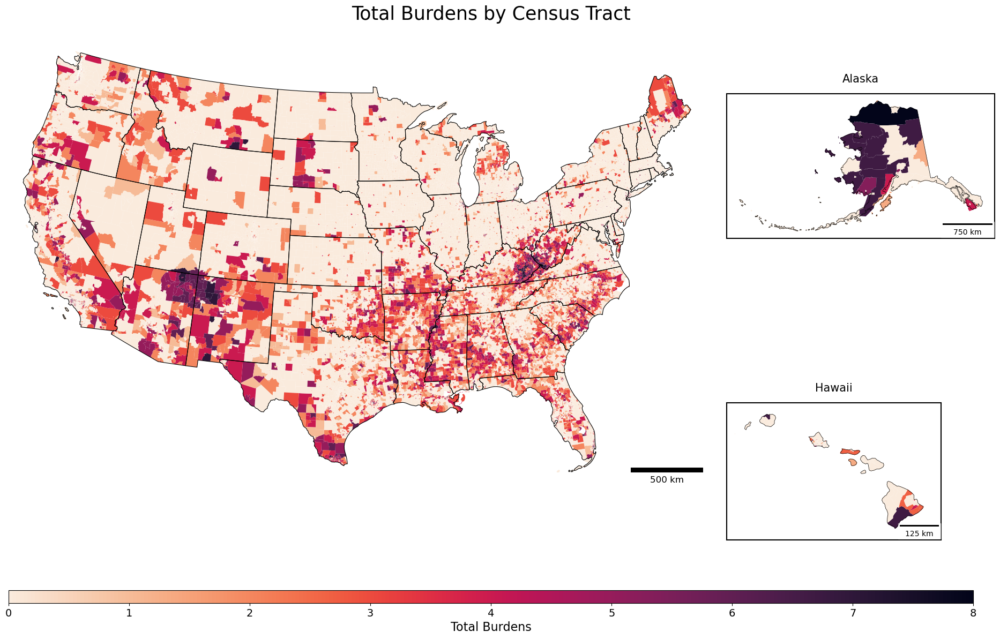

In [ ]:
def create_national_map(gdf, state_gdf):
    # Import scalebar
    from matplotlib_scalebar.scalebar import ScaleBar
    
    # Create figure with transparent background
    fig = plt.figure(figsize=(20, 12), facecolor='none')
    
    # CONUS takes up most of the left and central area
    ax_main = plt.axes([0.05, 0.15, 0.65, 0.8])
    
    # Alaska at top right (similar size to original)
    ax_ak = plt.axes([0.72, 0.5, 0.25, 0.4])
    
    # Hawaii at bottom right (similar size to original)
    ax_hi = plt.axes([0.72, 0.1, 0.2, 0.25])  # Using original dimensions
    
    # Explicit FIPS code filtering to exclude Puerto Rico (72)
    conus_fips = [str(i).zfill(2) for i in range(1, 57)]
    conus_fips = [x for x in conus_fips if x not in ['02', '15', '72']]
    
    # Filter and project data
    gdf_conus = gdf[~(gdf['tract_id'] // 1000000000).isin([2, 15, 72])].copy()
    gdf_conus = gdf_conus.to_crs('EPSG:5070')
    state_conus = state_gdf[state_gdf['STATEFP'].isin(conus_fips)].to_crs('EPSG:5070')
    
    # Filter and project Alaska with Alaska Albers projection
    gdf_ak = gdf[gdf['tract_id'] // 1000000000 == 2].to_crs('EPSG:3338')
    state_ak = state_gdf[state_gdf['STATEFP'] == '02'].to_crs('EPSG:3338')
    
    # Filter and project Hawaii 
    gdf_hi = gdf[gdf['tract_id'] // 1000000000 == 15].copy()
    state_hi = state_gdf[state_gdf['STATEFP'] == '15'].copy()
    
    # Debug - Check if Hawaii data exists
    print(f"Hawaii data count: {len(gdf_hi)}")
    
    # Project Hawaii data
    if not gdf_hi.empty:
        gdf_hi = gdf_hi.to_crs('EPSG:3750')
    if not state_hi.empty:
        state_hi = state_hi.to_crs('EPSG:3750')
    
    # Use rocket colormap from viridis but reversed
    cmap = plt.cm.get_cmap('rocket_r')
    
    # Set all axes to have transparent backgrounds
    ax_main.patch.set_alpha(0)
    ax_ak.patch.set_alpha(0)
    ax_hi.patch.set_alpha(0)
    
    # Plot regions
    state_conus.boundary.plot(ax=ax_main, color='black', linewidth=0.8)
    main_plot = gdf_conus.plot(ax=ax_main, column='total_burdens', 
                              cmap=cmap, legend=False)
    
    # Set the extent for CONUS to zoom in but show all states
    ax_main.set_xlim(state_conus.total_bounds[0] - 1e5, state_conus.total_bounds[2] + 1e5)
    ax_main.set_ylim(state_conus.total_bounds[1] - 1e5, state_conus.total_bounds[3] + 1e5)
    
    # Add scalebar for CONUS (EPSG:5070 uses meters)
    scalebar_conus = ScaleBar(1, units='m', dimension='si-length', 
                             location='lower right', 
                             box_alpha=0.5,
                             length_fraction=0.15,
                             font_properties={'size': 12})
    ax_main.add_artist(scalebar_conus)
    
    # Remove border around main map
    for spine in ax_main.spines.values():
        spine.set_visible(False)
    
    # Plot Alaska
    state_ak.boundary.plot(ax=ax_ak, color='black', linewidth=0.5)
    ak_plot = gdf_ak.plot(ax=ax_ak, column='total_burdens', 
                         cmap=cmap, legend=False)
    ax_ak.set_title('Alaska', pad=15, size=15)
    
    # Add scalebar for Alaska (EPSG:3338 uses meters)
    scalebar_ak = ScaleBar(1, units='m', dimension='si-length', 
                          location='lower right', 
                          box_alpha=0.5,
                          length_fraction=0.2,
                          font_properties={'size': 10})
    ax_ak.add_artist(scalebar_ak)
    
    # Add border around Alaska inset
    for spine in ax_ak.spines.values():
        spine.set_visible(True)
        spine.set_linewidth(1.5)
        spine.set_edgecolor('black')
    
    # Plot Hawaii - Check if the GeoDataFrame is not empty first
    if not gdf_hi.empty and not state_hi.empty:
        # Plot state boundaries
        state_hi.boundary.plot(ax=ax_hi, color='black', linewidth=0.5)
        
        # Plot the tract data
        hi_plot = gdf_hi.plot(ax=ax_hi, column='total_burdens', 
                             cmap=cmap, legend=False)
        
        # Add scalebar for Hawaii (EPSG:3750 uses meters)
        scalebar_hi = ScaleBar(1, units='m', dimension='si-length', 
                              location='lower right', 
                              box_alpha=0.5,
                              length_fraction=0.2,
                              font_properties={'size': 10})
        ax_hi.add_artist(scalebar_hi)
        
        # Zoom in on the main Hawaiian island (Oahu, where Honolulu is)
        # Find Big Island or Oahu, which should have the largest area
        try:
            # First attempt: find the largest island by area
            largest_island_idx = state_hi.area.idxmax()
            main_island = state_hi.iloc[[largest_island_idx]]
            
            # Get the centroid of the main island
            centroid = main_island.centroid.iloc[0]
            
            # Zoom to 70% of the island's extent
            x_range = main_island.total_bounds[2] - main_island.total_bounds[0]
            y_range = main_island.total_bounds[3] - main_island.total_bounds[1]
            zoom_factor = 1.5  # Zoom level (higher number = more zoomed in)
            
            ax_hi.set_xlim(centroid.x - x_range/zoom_factor, centroid.x + x_range/zoom_factor)
            ax_hi.set_ylim(centroid.y - y_range/zoom_factor, centroid.y + y_range/zoom_factor)
            
            print(f"Zoomed to centroid: ({centroid.x}, {centroid.y})")
        except Exception as e:
            print(f"Error zooming to Hawaii centroid: {e}")
            print("Falling back to standard extent...")
            
            # Fallback: just use the bounds of all Hawaii data
            buffer_factor = 0.1  # Provide some buffer around the islands
            x_range = state_hi.total_bounds[2] - state_hi.total_bounds[0]
            y_range = state_hi.total_bounds[3] - state_hi.total_bounds[1]
            
            ax_hi.set_xlim(state_hi.total_bounds[0] - x_range * buffer_factor,
                          state_hi.total_bounds[2] + x_range * buffer_factor)
            ax_hi.set_ylim(state_hi.total_bounds[1] - y_range * buffer_factor,
                          state_hi.total_bounds[3] + y_range * buffer_factor)
    else:
        # If Hawaii data is empty, just display a message
        ax_hi.text(0.5, 0.5, "No data available for Hawaii", 
                  ha='center', va='center', fontsize=12)
    
    ax_hi.set_title('Hawaii', pad=15, size=15)
    
    # Add border around Hawaii inset regardless
    for spine in ax_hi.spines.values():
        spine.set_visible(True)
        spine.set_linewidth(1.5)
        spine.set_edgecolor('black')
    
    # Remove tick labels but keep borders
    for ax in [ax_main, ax_ak, ax_hi]:
        ax.set_xticks([])
        ax.set_yticks([])
    
    # Add horizontal colorbar at the very bottom of the plot
    cax = fig.add_axes([0.05, 0.02, 0.9, 0.02])
    sm = plt.cm.ScalarMappable(cmap=cmap)
    sm.set_array(gdf['total_burdens'])
    cbar = fig.colorbar(sm, cax=cax, orientation='horizontal', 
                        label='Total burdens')
    
    # Make legend labels larger
    cbar.ax.tick_params(labelsize=14)  # Increase tick label size
    cbar.set_label('Total Burdens', size=16)  # Increase label size
    
    # Main title
    plt.suptitle('Total Burdens by Census Tract', 
                 y=0.95, 
                 fontsize=25)
    
    return fig

# Usage:
fig = create_national_map(national_results, state_polygons)

# Save with transparent background
plt.savefig('img/national_map_burdens.png', dpi=300, bbox_inches='tight', transparent=True)
plt.show()

Hawaii data count: 326


/tmp/ipykernel_795903/2762353200.py:44: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('rocket_r')


Error zooming to Hawaii centroid: positional indexers are out-of-bounds
Falling back to standard extent...


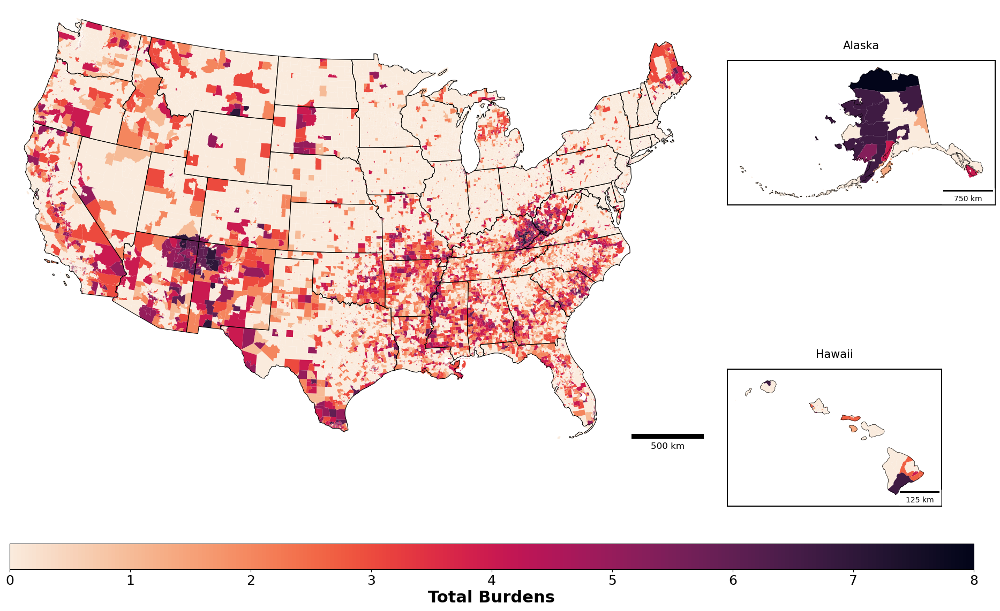

In [ ]:
def create_national_map(gdf, state_gdf):
    # Import scalebar
    from matplotlib_scalebar.scalebar import ScaleBar
    
    # Create figure with transparent background
    fig = plt.figure(figsize=(20, 12), facecolor='none')
    
    # CONUS takes up most of the left and central area
    ax_main = plt.axes([0.05, 0.15, 0.65, 0.8])
    
    # Alaska at top right (similar size to original)
    ax_ak = plt.axes([0.72, 0.5, 0.25, 0.4])
    
    # Hawaii at bottom right (similar size to original)
    ax_hi = plt.axes([0.72, 0.1, 0.2, 0.25])  # Using original dimensions
    
    # Explicit FIPS code filtering to exclude Puerto Rico (72)
    conus_fips = [str(i).zfill(2) for i in range(1, 57)]
    conus_fips = [x for x in conus_fips if x not in ['02', '15', '72']]
    
    # Filter and project data
    gdf_conus = gdf[~(gdf['tract_id'] // 1000000000).isin([2, 15, 72])].copy()
    gdf_conus = gdf_conus.to_crs('EPSG:5070')
    state_conus = state_gdf[state_gdf['STATEFP'].isin(conus_fips)].to_crs('EPSG:5070')
    
    # Filter and project Alaska with Alaska Albers projection
    gdf_ak = gdf[gdf['tract_id'] // 1000000000 == 2].to_crs('EPSG:3338')
    state_ak = state_gdf[state_gdf['STATEFP'] == '02'].to_crs('EPSG:3338')
    
    # Filter and project Hawaii 
    gdf_hi = gdf[gdf['tract_id'] // 1000000000 == 15].copy()
    state_hi = state_gdf[state_gdf['STATEFP'] == '15'].copy()
    
    # Debug - Check if Hawaii data exists
    print(f"Hawaii data count: {len(gdf_hi)}")
    
    # Project Hawaii data
    if not gdf_hi.empty:
        gdf_hi = gdf_hi.to_crs('EPSG:3750')
    if not state_hi.empty:
        state_hi = state_hi.to_crs('EPSG:3750')
    
    # Use rocket colormap from viridis but reversed
    cmap = plt.cm.get_cmap('rocket_r')
    
    # Set all axes to have transparent backgrounds
    ax_main.patch.set_alpha(0)
    ax_ak.patch.set_alpha(0)
    ax_hi.patch.set_alpha(0)
    
    # Plot regions
    state_conus.boundary.plot(ax=ax_main, color='black', linewidth=0.8)
    main_plot = gdf_conus.plot(ax=ax_main, column='total_burdens', 
                              cmap=cmap, legend=False)
    
    # Set the extent for CONUS to zoom in but show all states
    ax_main.set_xlim(state_conus.total_bounds[0] - 1e5, state_conus.total_bounds[2] + 1e5)
    ax_main.set_ylim(state_conus.total_bounds[1] - 1e5, state_conus.total_bounds[3] + 1e5)
    
    # Add scalebar for CONUS (EPSG:5070 uses meters)
    scalebar_conus = ScaleBar(1, dimension='si-length', units='m', 
                             location='lower right', 
                             box_alpha=0.5,
                             length_fraction=0.15,
                             font_properties={'size': 12})
    ax_main.add_artist(scalebar_conus)
    
    # Remove border around main map
    for spine in ax_main.spines.values():
        spine.set_visible(False)
    
    # Plot Alaska
    state_ak.boundary.plot(ax=ax_ak, color='black', linewidth=0.5)
    ak_plot = gdf_ak.plot(ax=ax_ak, column='total_burdens', 
                         cmap=cmap, legend=False)
    ax_ak.set_title('Alaska', pad=15, size=15)
    
    # Add scalebar for Alaska (EPSG:3338 uses meters)
    scalebar_ak = ScaleBar(1, dimension='si-length', units='m', 
                          location='lower right', 
                          box_alpha=0.5,
                          length_fraction=0.2,
                          font_properties={'size': 10})
    ax_ak.add_artist(scalebar_ak)
    
    # Add border around Alaska inset
    for spine in ax_ak.spines.values():
        spine.set_visible(True)
        spine.set_linewidth(1.5)
        spine.set_edgecolor('black')
    
    # Plot Hawaii - Check if the GeoDataFrame is not empty first
    if not gdf_hi.empty and not state_hi.empty:
        # Plot state boundaries
        state_hi.boundary.plot(ax=ax_hi, color='black', linewidth=0.5)
        
        # Plot the tract data
        hi_plot = gdf_hi.plot(ax=ax_hi, column='total_burdens', 
                             cmap=cmap, legend=False)
        
        # Add scalebar for Hawaii (EPSG:3750 uses meters)
        scalebar_hi = ScaleBar(1, dimension='si-length', units='m', 
                              location='lower right', 
                              box_alpha=0.5,
                              length_fraction=0.2,
                              font_properties={'size': 10})
        ax_hi.add_artist(scalebar_hi)
        
        # Zoom in on the main Hawaiian island (Oahu, where Honolulu is)
        # Find Big Island or Oahu, which should have the largest area
        try:
            # First attempt: find the largest island by area
            largest_island_idx = state_hi.area.idxmax()
            main_island = state_hi.iloc[[largest_island_idx]]
            
            # Get the centroid of the main island
            centroid = main_island.centroid.iloc[0]
            
            # Zoom to 70% of the island's extent
            x_range = main_island.total_bounds[2] - main_island.total_bounds[0]
            y_range = main_island.total_bounds[3] - main_island.total_bounds[1]
            zoom_factor = 1.5  # Zoom level (higher number = more zoomed in)
            
            ax_hi.set_xlim(centroid.x - x_range/zoom_factor, centroid.x + x_range/zoom_factor)
            ax_hi.set_ylim(centroid.y - y_range/zoom_factor, centroid.y + y_range/zoom_factor)
            
            print(f"Zoomed to centroid: ({centroid.x}, {centroid.y})")
        except Exception as e:
            print(f"Error zooming to Hawaii centroid: {e}")
            print("Falling back to standard extent...")
            
            # Fallback: just use the bounds of all Hawaii data
            buffer_factor = 0.1  # Provide some buffer around the islands
            x_range = state_hi.total_bounds[2] - state_hi.total_bounds[0]
            y_range = state_hi.total_bounds[3] - state_hi.total_bounds[1]
            
            ax_hi.set_xlim(state_hi.total_bounds[0] - x_range * buffer_factor,
                          state_hi.total_bounds[2] + x_range * buffer_factor)
            ax_hi.set_ylim(state_hi.total_bounds[1] - y_range * buffer_factor,
                          state_hi.total_bounds[3] + y_range * buffer_factor)
    else:
        # If Hawaii data is empty, just display a message
        ax_hi.text(0.5, 0.5, "No data available for Hawaii", 
                  ha='center', va='center', fontsize=12)
    
    ax_hi.set_title('Hawaii', pad=15, size=15)
    
    # Add border around Hawaii inset regardless
    for spine in ax_hi.spines.values():
        spine.set_visible(True)
        spine.set_linewidth(1.5)
        spine.set_edgecolor('black')
    
    # Remove tick labels but keep borders
    for ax in [ax_main, ax_ak, ax_hi]:
        ax.set_xticks([])
        ax.set_yticks([])
    
    # Add horizontal colorbar at the very bottom of the plot
    # MODIFIED: Made the colorbar taller and adjusted position
    cax = fig.add_axes([0.05, 0.02, 0.9, 0.04])  # Increased height from 0.02 to 0.04
    sm = plt.cm.ScalarMappable(cmap=cmap)
    sm.set_array(gdf['total_burdens'])
    cbar = fig.colorbar(sm, cax=cax, orientation='horizontal')
    
    # MODIFIED: Make legend labels significantly larger
    cbar.ax.tick_params(labelsize=18)  # Increased from 14 to 18
    cbar.set_label('Total Burdens', size=22, fontweight='bold')  # Increased from 16 to 22 and made bold
    
    return fig

# Usage:
fig = create_national_map(national_results, state_polygons)

# Save with transparent background
plt.savefig('img/national_map_burdens.png', dpi=300, bbox_inches='tight', transparent=True)
plt.show()

# Standardized G* Values nationally

/tmp/ipykernel_795903/3647247896.py:17: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  (national_results.geometry.centroid.x > -125) &
/tmp/ipykernel_795903/3647247896.py:18: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  (national_results.geometry.centroid.x < -66) &
/tmp/ipykernel_795903/3647247896.py:19: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  (national_results.geometry.centroid.y > 24) &
/tmp/ipykernel_795903/3647247896.py:20: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometr

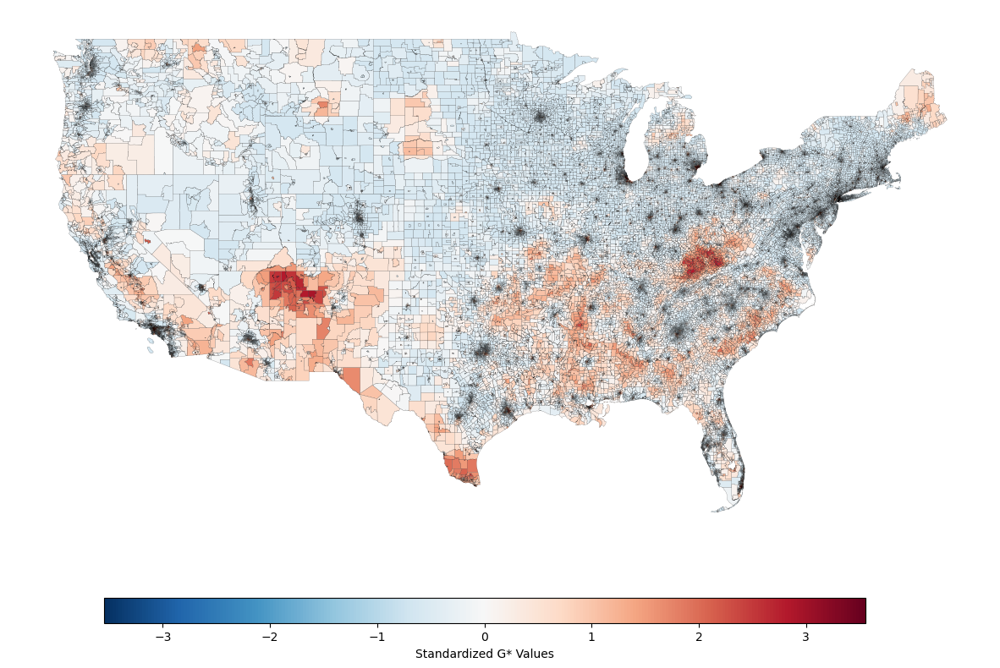

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib.cm as cm
from matplotlib.colorbar import ColorbarBase
import numpy as np
import contextily as ctx

# Assuming national_results is your DataFrame
# If this code is in a separate script, you'll need to load your data first
# national_results = gpd.read_file('path_to_your_data.geojson')

# Filter to just the contiguous United States (excluding Alaska, Hawaii, and territories)
# This is a simple approach - you might need to adjust based on your specific data
# Contiguous US roughly falls within these bounds
contiguous_mask = (
    (national_results.geometry.centroid.x > -125) & 
    (national_results.geometry.centroid.x < -66) & 
    (national_results.geometry.centroid.y > 24) & 
    (national_results.geometry.centroid.y < 50)
)
contiguous_us = national_results[contiguous_mask].copy()

# Check your projection
if contiguous_us.crs is None or contiguous_us.crs.to_epsg() != 4326:
    # If not in WGS84 (EPSG:4326), reproject
    contiguous_us = contiguous_us.to_crs(epsg=4326)

# Create a figure with a specific size
fig, ax = plt.subplots(1, 1, figsize=(15, 10))

# Set up a diverging colormap (centered at 0 since standardized scores often have 0 as the mean)
# You can change the colormap to your preference
vmin = contiguous_us['standardized_g_star'].min()
vmax = contiguous_us['standardized_g_star'].max()
vabs = max(abs(vmin), abs(vmax))
norm = colors.Normalize(vmin=-vabs, vmax=vabs)
cmap = cm.RdBu_r  # Red-Blue diverging colormap, reversed

# Plot the data
contiguous_us.plot(
    column='standardized_g_star',
    cmap=cmap,
    norm=norm,
    linewidth=0.1,  # Thin black borders
    edgecolor='black',
    ax=ax
)

# Remove axes
ax.set_axis_off()


# Add a horizontal colorbar at the bottom
cbar_ax = fig.add_axes([0.2, 0.08, 0.6, 0.03])  # [left, bottom, width, height]
ColorbarBase(
    cbar_ax, 
    cmap=cmap,
    norm=norm,
    orientation='horizontal',
    label='Standardized G* Values'
)

# To improve context, you can add a basemap (optional)
# Project to Web Mercator for compatibility with contextily basemaps
contiguous_us_webmerc = contiguous_us.to_crs(epsg=3857)
# ctx.add_basemap(ax, crs=contiguous_us_webmerc.crs)

# Save the figure
plt.savefig('img/us_standardized_g_star_map.png', dpi=300, bbox_inches='tight', transparent=True)

# Show the plot
plt.show()

/tmp/ipykernel_795903/1977002707.py:17: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  (national_results.geometry.centroid.x > -125) &
/tmp/ipykernel_795903/1977002707.py:18: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  (national_results.geometry.centroid.x < -66) &
/tmp/ipykernel_795903/1977002707.py:19: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  (national_results.geometry.centroid.y > 24) &
/tmp/ipykernel_795903/1977002707.py:20: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometr

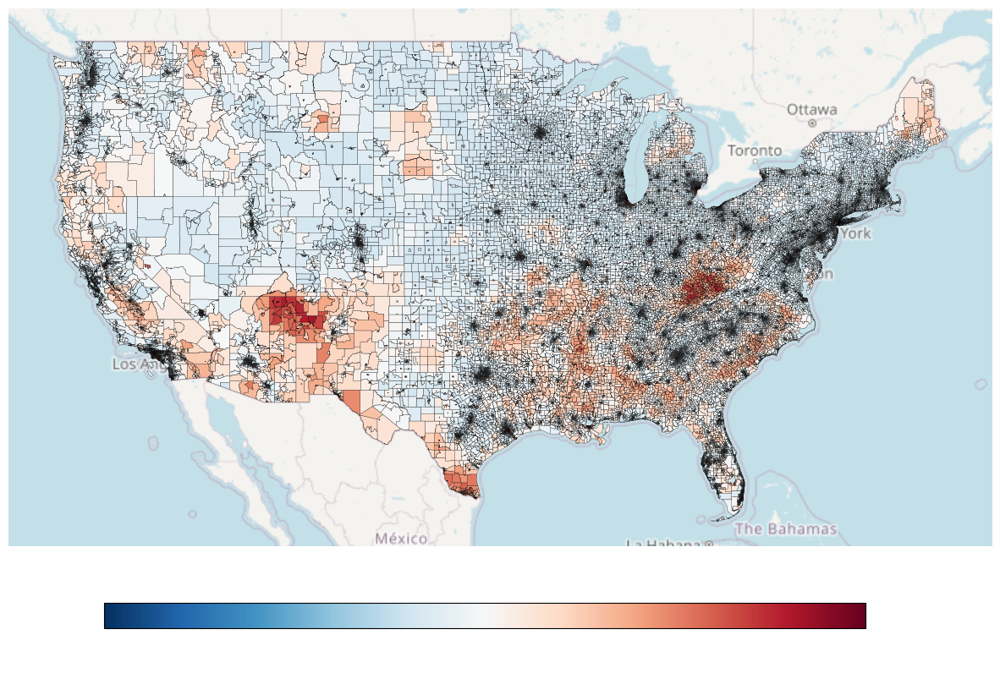

In [54]:
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib.cm as cm
from matplotlib.colorbar import ColorbarBase
import numpy as np
import contextily as ctx

# Assuming national_results is your DataFrame
# If this code is in a separate script, you'll need to load your data first
# national_results = gpd.read_file('path_to_your_data.geojson')

# Filter to just the contiguous United States (excluding Alaska, Hawaii, and territories)
# This is a simple approach - you might need to adjust based on your specific data
# Contiguous US roughly falls within these bounds
contiguous_mask = (
    (national_results.geometry.centroid.x > -125) & 
    (national_results.geometry.centroid.x < -66) & 
    (national_results.geometry.centroid.y > 24) & 
    (national_results.geometry.centroid.y < 50)
)
contiguous_us = national_results[contiguous_mask].copy()

# Check your projection
if contiguous_us.crs is None or contiguous_us.crs.to_epsg() != 4326:
    # If not in WGS84 (EPSG:4326), reproject
    contiguous_us = contiguous_us.to_crs(epsg=4326)

# Project to Web Mercator for compatibility with contextily basemaps
contiguous_us_webmerc = contiguous_us.to_crs(epsg=3857)

# Create a figure with a specific size
fig, ax = plt.subplots(1, 1, figsize=(15, 10))

# Set up a diverging colormap (centered at 0 since standardized scores often have 0 as the mean)
# You can change the colormap to your preference
vmin = contiguous_us_webmerc['standardized_g_star'].min()
vmax = contiguous_us_webmerc['standardized_g_star'].max()
vabs = max(abs(vmin), abs(vmax))
norm = colors.Normalize(vmin=-vabs, vmax=vabs)
cmap = cm.RdBu_r  # Red-Blue diverging colormap, reversed

# Plot the data using the Web Mercator projection
contiguous_us_webmerc.plot(
    column='standardized_g_star',
    cmap=cmap,
    norm=norm,
    linewidth=0.2,  # Thin black borders
    edgecolor='black',
    ax=ax
)

# Add a basemap using OpenStreetMap (most reliable option)
# Use the simpler syntax that works across most contextily versions
ctx.add_basemap(
    ax,
    source="https://tile.openstreetmap.org/{z}/{x}/{y}.png",
    alpha=0.7  # Adjust transparency as needed
)

# Remove axes
ax.set_axis_off()

# Add a horizontal colorbar at the bottom
cbar_ax = fig.add_axes([0.2, 0.08, 0.6, 0.03])  # [left, bottom, width, height]
ColorbarBase(
    cbar_ax, 
    cmap=cmap,
    norm=norm,
    orientation='horizontal',
    label='Standardized G* Values'
)

# Set the label text color to white
cbar_ax.xaxis.label.set_color('white')
cbar_ax.tick_params(colors='white')  

# Save the figure
plt.savefig('img/us_standardized_g_star_map.png', dpi=300, bbox_inches='tight', transparent=True)

# Show the plot
plt.show()

Number of census tracts in/intersecting area: 2877


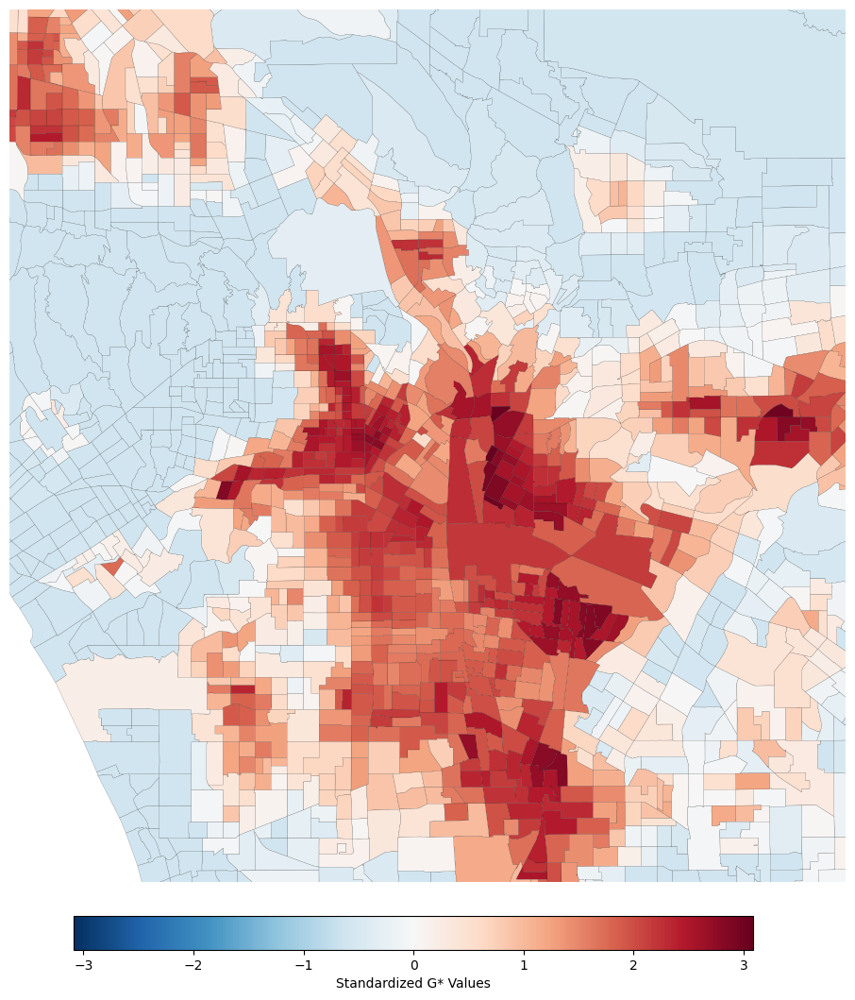

Data CRS: EPSG:3857
Original bounding box (WGS84): (-118.95, 33.7, -117.65, 34.82)


In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib.cm as cm
from matplotlib.colorbar import ColorbarBase
import numpy as np
from shapely.geometry import box

# Assuming national_results is your DataFrame
# If this code is in a separate script, you'll need to load your data first
# national_results = gpd.read_file('path_to_your_data.geojson')

# Define a bounding box for the area of interest
area_bounds = (-118.95, 33.70, -117.65, 34.82)  # (min_x, min_y, max_x, max_y)

# Create a geometric box from the bounds
bbox = box(area_bounds[0], area_bounds[1], area_bounds[2], area_bounds[3])

# Make sure the CRS is correct before spatial operations
if national_results.crs is None:
    print("Warning: CRS is not defined. Assuming WGS84.")
    national_results.crs = "EPSG:4326"
elif national_results.crs.to_epsg() != 4326:
    national_results = national_results.to_crs(epsg=4326)

# Create a GeoDataFrame for the bounding box with the same CRS
bbox_gdf = gpd.GeoDataFrame({'geometry': [bbox]}, crs="EPSG:4326")

# Filter to include any tract that intersects with the bounding box
# This includes tracts that are only partially within the bounds
area_of_interest = national_results[national_results.intersects(bbox.boundary) | 
                                   national_results.within(bbox)].copy()

print(f"Number of census tracts in/intersecting area: {len(area_of_interest)}")

# Convert to Web Mercator for consistent mapping
area_of_interest_webmerc = area_of_interest.to_crs(epsg=3857)
bbox_webmerc = bbox_gdf.to_crs(epsg=3857)

# Define downtown LA coordinates (approximate)
# Downtown LA is roughly at (-118.25, 34.05) in WGS84
downtown_la_wgs84 = (-118.25, 34.05)
# Convert to Web Mercator
from pyproj import Transformer
transformer = Transformer.from_crs("EPSG:4326", "EPSG:3857", always_xy=True)
downtown_la_x, downtown_la_y = transformer.transform(downtown_la_wgs84[0], downtown_la_wgs84[1])

# Create a figure with a specific size
fig, ax = plt.subplots(1, 1, figsize=(12, 12))

# Set up a diverging colormap
vmin = area_of_interest_webmerc['standardized_g_star'].min()
vmax = area_of_interest_webmerc['standardized_g_star'].max()
vabs = max(abs(vmin), abs(vmax))
norm = colors.Normalize(vmin=-vabs, vmax=vabs)
cmap = cm.RdBu_r  # Red-Blue diverging colormap, reversed

# Plot the data
area_of_interest_webmerc.plot(
    column='standardized_g_star',
    cmap=cmap,
    norm=norm,
    linewidth=0.1,  # Thin black borders
    edgecolor='black',
    ax=ax
)

# Plot the bounding box as a reference (optional)
bbox_webmerc.boundary.plot(ax=ax, color='red', linewidth=1)

# Calculate 50% zoomed in extent
bbox_bounds = bbox_webmerc.total_bounds
x_range = bbox_bounds[2] - bbox_bounds[0]
y_range = bbox_bounds[3] - bbox_bounds[1]

# Set the extent to 50% zoomed in around downtown LA
zoom_factor = 0.35  # 50% zoom original
ax.set_xlim(downtown_la_x - x_range * zoom_factor / 2, downtown_la_x + x_range * zoom_factor / 2)
ax.set_ylim(downtown_la_y - y_range * zoom_factor / 2, downtown_la_y + y_range * zoom_factor / 2)

# Remove axes
ax.set_axis_off()

# Add a horizontal colorbar at the bottom
cbar_ax = fig.add_axes([0.2, 0.05, 0.6, 0.03])  # [left, bottom, width, height]
ColorbarBase(
    cbar_ax, 
    cmap=cmap,
    norm=norm,
    orientation='horizontal',
    label='Standardized G* Values'
)

# Save the figure
plt.savefig('img/la_county_zoomed_standardized_g_star_map.png', dpi=300, bbox_inches='tight')

# Show the plot
plt.show()

# Diagnostic information
print(f"Data CRS: {area_of_interest_webmerc.crs}")
print(f"Original bounding box (WGS84): {area_bounds}")
#print(f"Zoomed to centroid at: {centroid.x}, {centroid.y}")

Number of census tracts in/intersecting area: 2877
Basemap added successfully


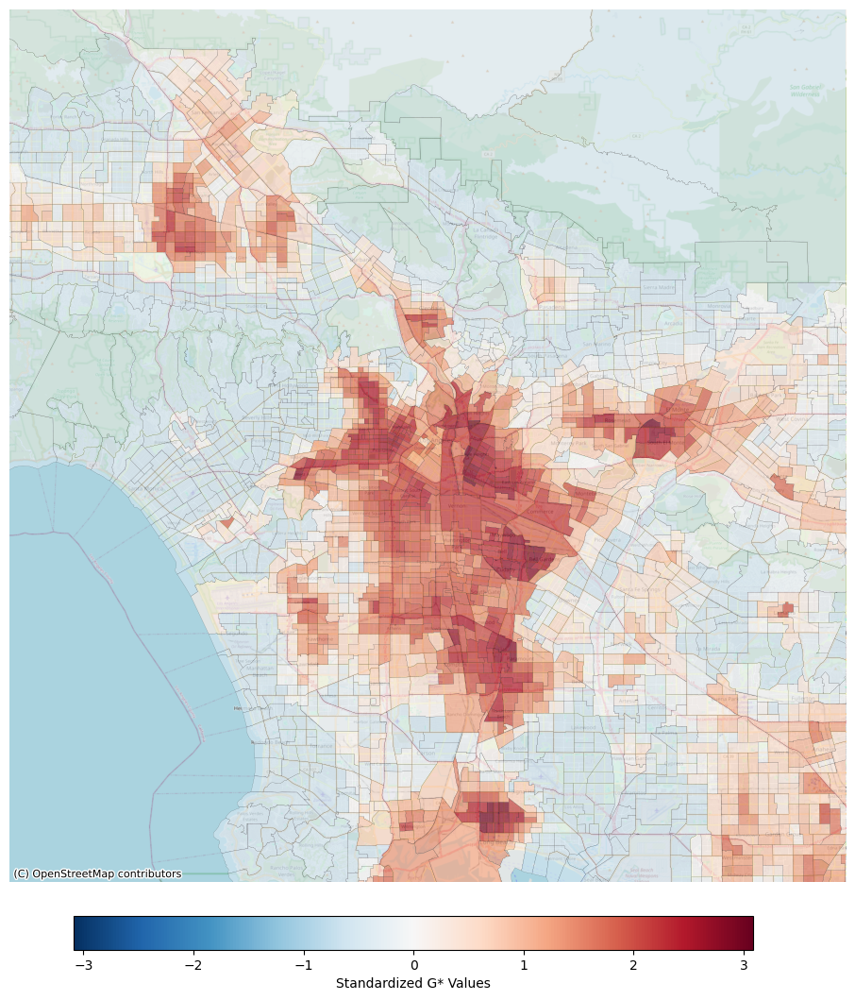

Data CRS: EPSG:3857
Original bounding box (WGS84): (-118.95, 33.7, -117.65, 34.82)
Zoomed to downtown LA at: -13163529.786304599, 4035517.782084743


Number of census tracts in/intersecting area: 2877
Basemap added successfully


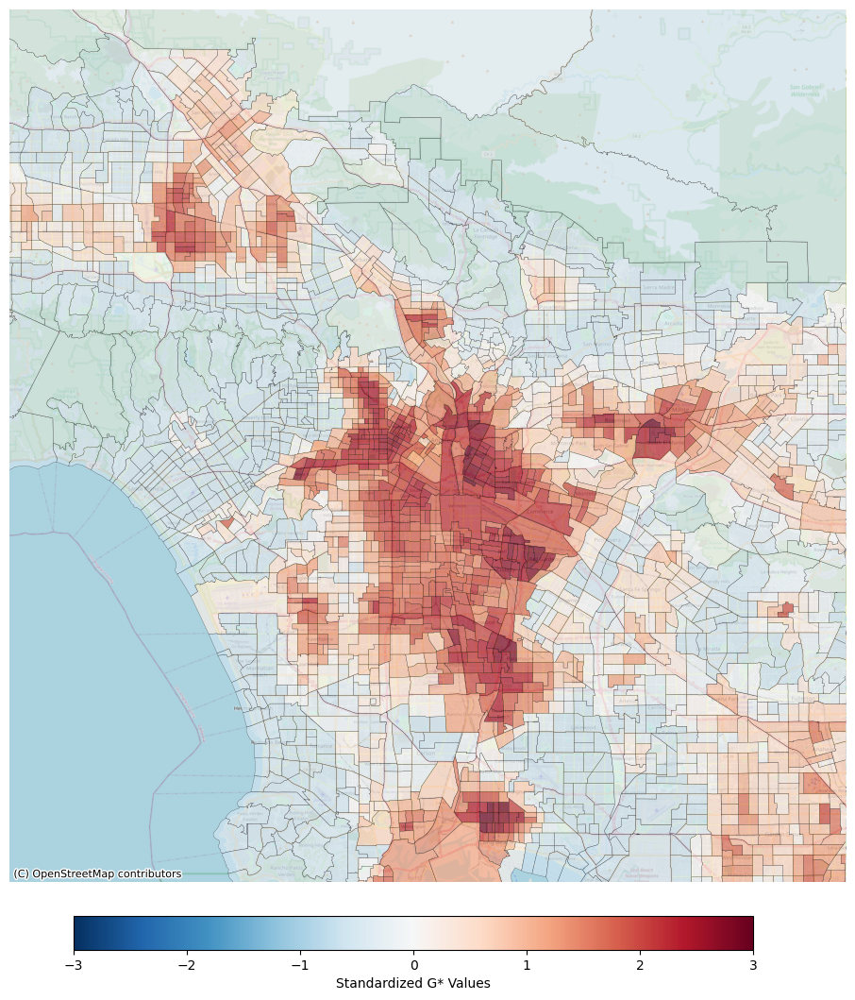

Data CRS: EPSG:3857
Original bounding box (WGS84): (-118.95, 33.7, -117.65, 34.82)
Zoomed to downtown LA at: -13163529.786304599, 4035517.782084743


In [52]:
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib.cm as cm
from matplotlib.colorbar import ColorbarBase
import numpy as np
from shapely.geometry import box
import contextily as ctx
from pyproj import Transformer

# Assuming national_results is your DataFrame
# If this code is in a separate script, you'll need to load your data first
# national_results = gpd.read_file('path_to_your_data.geojson')

# Define a bounding box for the area of interest
area_bounds = (-118.95, 33.70, -117.65, 34.82)  # (min_x, min_y, max_x, max_y)
#area_bounds = (-118.95, 33.10, -117.65, 34.22) 

# Create a geometric box from the bounds
bbox = box(area_bounds[0], area_bounds[1], area_bounds[2], area_bounds[3])

# Make sure the CRS is correct before spatial operations
if national_results.crs is None:
    print("Warning: CRS is not defined. Assuming WGS84.")
    national_results.crs = "EPSG:4326"
elif national_results.crs.to_epsg() != 4326:
    national_results = national_results.to_crs(epsg=4326)

# Create a GeoDataFrame for the bounding box with the same CRS
bbox_gdf = gpd.GeoDataFrame({'geometry': [bbox]}, crs="EPSG:4326")

# Filter to include any tract that intersects with the bounding box
# This includes tracts that are only partially within the bounds
area_of_interest = national_results[national_results.intersects(bbox.boundary) | 
                                   national_results.within(bbox)].copy()

print(f"Number of census tracts in/intersecting area: {len(area_of_interest)}")

# Convert to Web Mercator for consistent mapping
area_of_interest_webmerc = area_of_interest.to_crs(epsg=3857)
bbox_webmerc = bbox_gdf.to_crs(epsg=3857)

# Define downtown LA coordinates (approximate)
# Downtown LA is roughly at (-118.25, 34.05) in WGS84
downtown_la_wgs84 = (-118.25, 34.05)
# Convert to Web Mercator
transformer = Transformer.from_crs("EPSG:4326", "EPSG:3857", always_xy=True)
downtown_la_x, downtown_la_y = transformer.transform(downtown_la_wgs84[0], downtown_la_wgs84[1])

# Create a figure with a specific size
fig, ax = plt.subplots(1, 1, figsize=(12, 12))

# Set up a diverging colormap with fixed range from -3 to 3
vmin = -3
vmax = 3
norm = colors.Normalize(vmin=vmin, vmax=vmax)
cmap = cm.RdBu_r  # Red-Blue diverging colormap, reversed

# Plot the data
area_of_interest_webmerc.plot(
    column='standardized_g_star',
    cmap=cmap,
    norm=norm,
    linewidth=0.2,  # Thin black borders
    edgecolor='black',
    alpha=0.7,  # Add transparency to see the basemap beneath
    ax=ax
)

# Plot the bounding box as a reference (optional)
bbox_webmerc.boundary.plot(ax=ax, color='red', linewidth=1)

# Calculate zoom extent
bbox_bounds = bbox_webmerc.total_bounds
x_range = bbox_bounds[2] - bbox_bounds[0]
y_range = bbox_bounds[3] - bbox_bounds[1]

# Set the extent to zoomed in around downtown LA
zoom_factor = 0.55  # 55% zoom
ax.set_xlim(downtown_la_x - x_range * zoom_factor / 2, downtown_la_x + x_range * zoom_factor / 2)
ax.set_ylim(downtown_la_y - y_range * zoom_factor / 2, downtown_la_y + y_range * zoom_factor / 2)

# Add the basemap back
try:
    ctx.add_basemap(
        ax, 
        source=ctx.providers.OpenStreetMap.Mapnik,
        zoom=12  # Higher zoom level for downtown area
    )
    print("Basemap added successfully")
except Exception as e:
    print(f"Error adding basemap: {e}")
    # Fallback to another tile provider
    try:
        ctx.add_basemap(
            ax,
            source=ctx.providers.Stamen.TonerLite,
            zoom=12
        )
        print("Fallback basemap added")
    except Exception as e2:
        print(f"Error adding fallback basemap: {e2}")

# Remove axes
ax.set_axis_off()

# Add a horizontal colorbar at the bottom
cbar_ax = fig.add_axes([0.2, 0.05, 0.6, 0.03])  # [left, bottom, width, height]
ColorbarBase(
    cbar_ax, 
    cmap=cmap,
    norm=norm,
    orientation='horizontal',
    label='Standardized G* Values'
)

# Save the figure
plt.savefig('img/downtown_la_standardized_g_star_map.png', dpi=300, bbox_inches='tight', transparent='true')

# Show the plot
plt.show()

# Diagnostic information
print(f"Data CRS: {area_of_interest_webmerc.crs}")
print(f"Original bounding box (WGS84): {area_bounds}")
print(f"Zoomed to downtown LA at: {downtown_la_x}, {downtown_la_y}")

Number of census tracts in/intersecting area: 3063
Basemap added successfully


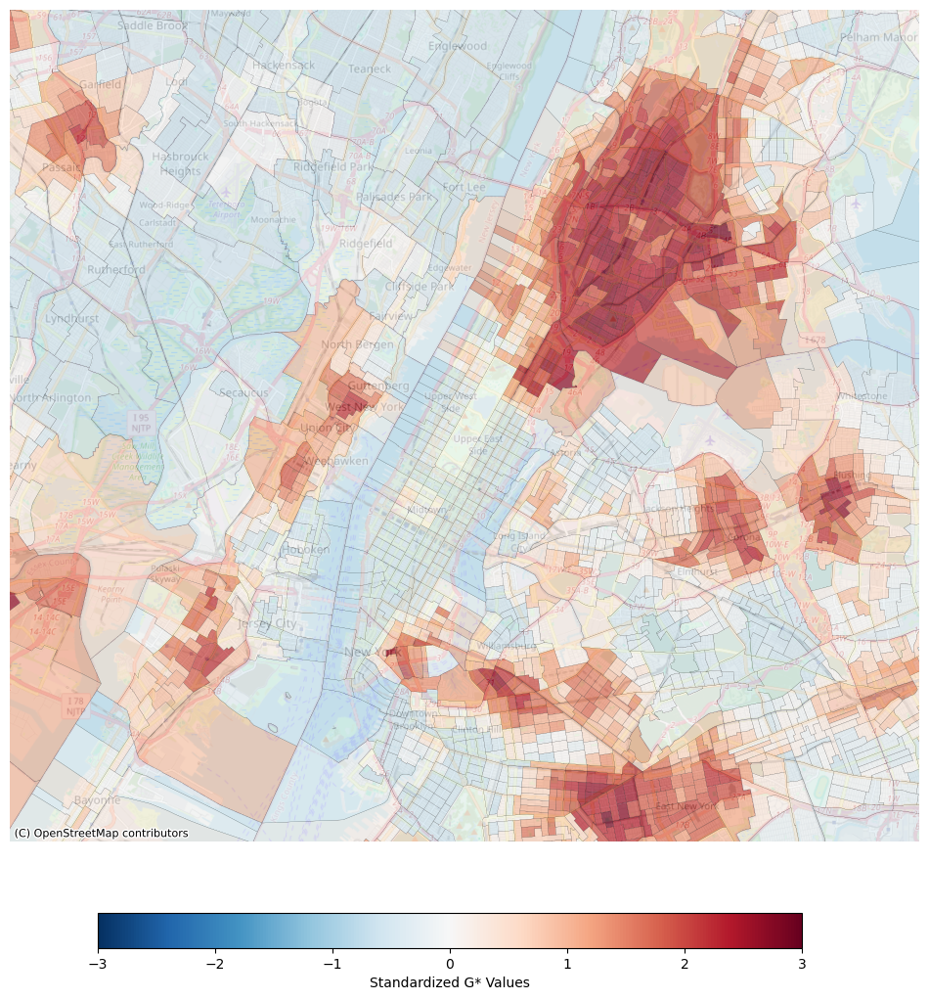

Data CRS: EPSG:3857
Original bounding box (WGS84): (-74.3, 40.5, -73.65, 40.95)
Zoomed to Manhattan at: -8234302.733978447, 4979945.670525387


In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib.cm as cm
from matplotlib.colorbar import ColorbarBase
import numpy as np
from shapely.geometry import box
import contextily as ctx
from pyproj import Transformer

# Assuming national_results is your DataFrame
# If this code is in a separate script, you'll need to load your data first
# national_results = gpd.read_file('path_to_your_data.geojson')

# Define a bounding box for New York City
# Approximate coordinates for NYC metro area (min_x, min_y, max_x, max_y)
area_bounds = (-74.30, 40.50, -73.65, 40.95)

# Create a geometric box from the bounds
bbox = box(area_bounds[0], area_bounds[1], area_bounds[2], area_bounds[3])

# Make sure the CRS is correct before spatial operations
if national_results.crs is None:
    print("Warning: CRS is not defined. Assuming WGS84.")
    national_results.crs = "EPSG:4326"
elif national_results.crs.to_epsg() != 4326:
    national_results = national_results.to_crs(epsg=4326)

# Create a GeoDataFrame for the bounding box with the same CRS
bbox_gdf = gpd.GeoDataFrame({'geometry': [bbox]}, crs="EPSG:4326")

# Filter to include any tract that intersects with the bounding box
# This includes tracts that are only partially within the bounds
area_of_interest = national_results[national_results.intersects(bbox.boundary) | 
                                   national_results.within(bbox)].copy()

print(f"Number of census tracts in/intersecting area: {len(area_of_interest)}")

# Convert to Web Mercator for consistent mapping
area_of_interest_webmerc = area_of_interest.to_crs(epsg=3857)
bbox_webmerc = bbox_gdf.to_crs(epsg=3857)

# Define Manhattan coordinates (approximate center of NYC)
# Manhattan is roughly at (-73.97, 40.78) in WGS84
manhattan_wgs84 = (-73.97, 40.78)
# Convert to Web Mercator
transformer = Transformer.from_crs("EPSG:4326", "EPSG:3857", always_xy=True)
manhattan_x, manhattan_y = transformer.transform(manhattan_wgs84[0], manhattan_wgs84[1])

# Create a figure with a specific size
fig, ax = plt.subplots(1, 1, figsize=(12, 12))

# Set up a diverging colormap with fixed range from -3 to 3
vmin = -3
vmax = 3
norm = colors.Normalize(vmin=vmin, vmax=vmax)
cmap = cm.RdBu_r  # Red-Blue diverging colormap, reversed

# Plot the data
area_of_interest_webmerc.plot(
    column='standardized_g_star',
    cmap=cmap,
    norm=norm,
    linewidth=0.1,  # Thin black borders
    edgecolor='black',
    alpha=0.7,  # Add transparency to see the basemap beneath
    ax=ax
)

# Plot the bounding box as a reference (optional)
bbox_webmerc.boundary.plot(ax=ax, color='red', linewidth=1)

# Calculate zoom extent
bbox_bounds = bbox_webmerc.total_bounds
x_range = bbox_bounds[2] - bbox_bounds[0]
y_range = bbox_bounds[3] - bbox_bounds[1]

# Set the extent to zoomed in around Manhattan
zoom_factor = 0.55  # 55% zoom
ax.set_xlim(manhattan_x - x_range * zoom_factor / 2, manhattan_x + x_range * zoom_factor / 2)
ax.set_ylim(manhattan_y - y_range * zoom_factor / 2, manhattan_y + y_range * zoom_factor / 2)

# Add the basemap back
try:
    ctx.add_basemap(
        ax, 
        source=ctx.providers.OpenStreetMap.Mapnik,
        zoom=12  # Higher zoom level for Manhattan area
    )
    print("Basemap added successfully")
except Exception as e:
    print(f"Error adding basemap: {e}")
    # Fallback to another tile provider
    try:
        ctx.add_basemap(
            ax,
            source=ctx.providers.Stamen.TonerLite,
            zoom=12
        )
        print("Fallback basemap added")
    except Exception as e2:
        print(f"Error adding fallback basemap: {e2}")

# Remove axes
ax.set_axis_off()

# Add a horizontal colorbar at the bottom
cbar_ax = fig.add_axes([0.2, 0.05, 0.6, 0.03])  # [left, bottom, width, height]
ColorbarBase(
    cbar_ax, 
    cmap=cmap,
    norm=norm,
    orientation='horizontal',
    label='Standardized G* Values'
)


# Save the figure
plt.savefig('img/nyc_standardized_g_star_map.png', dpi=300, bbox_inches='tight')

# Show the plot
plt.show()

# Diagnostic information
print(f"Data CRS: {area_of_interest_webmerc.crs}")
print(f"Original bounding box (WGS84): {area_bounds}")
print(f"Zoomed to Manhattan at: {manhattan_x}, {manhattan_y}")

Number of census tracts in/intersecting area: 3063
Basemap added successfully


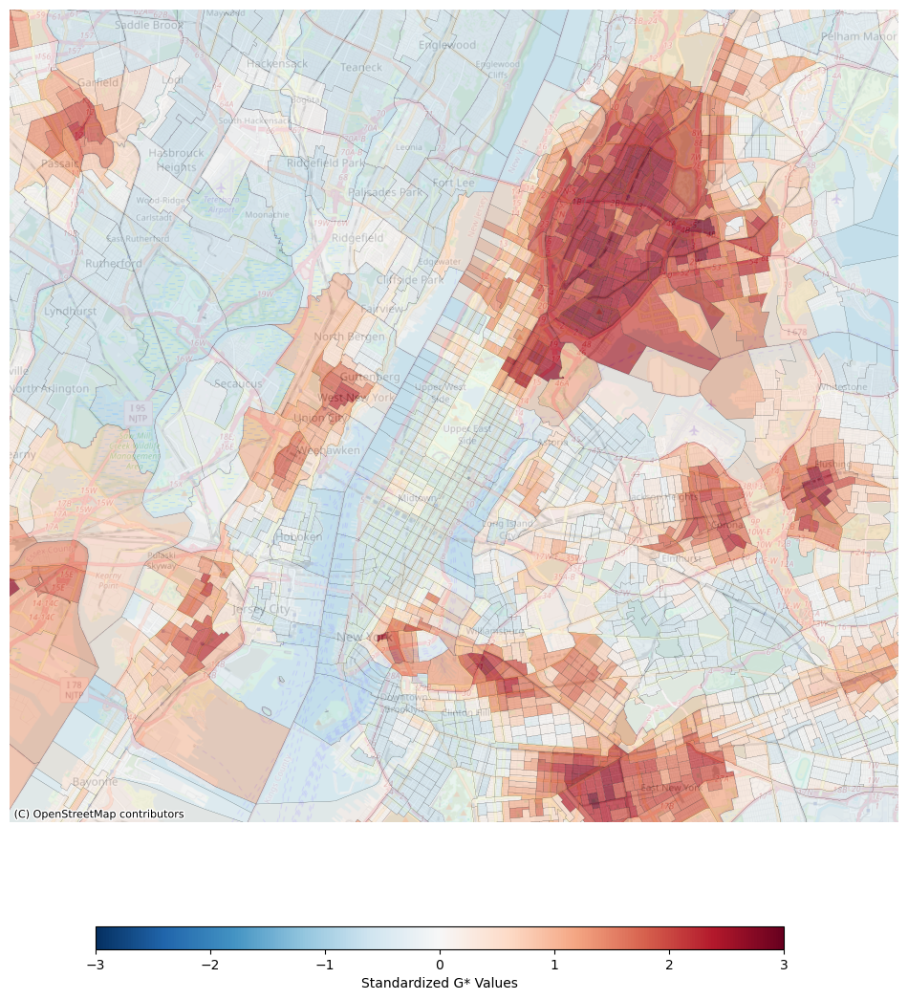

Data CRS: EPSG:3857
Original bounding box (WGS84): (-74.3, 40.5, -73.65, 40.95)
Zoomed to Manhattan at: -8234302.733978447, 4979945.670525387


Number of census tracts in/intersecting area: 3063
Basemap added successfully


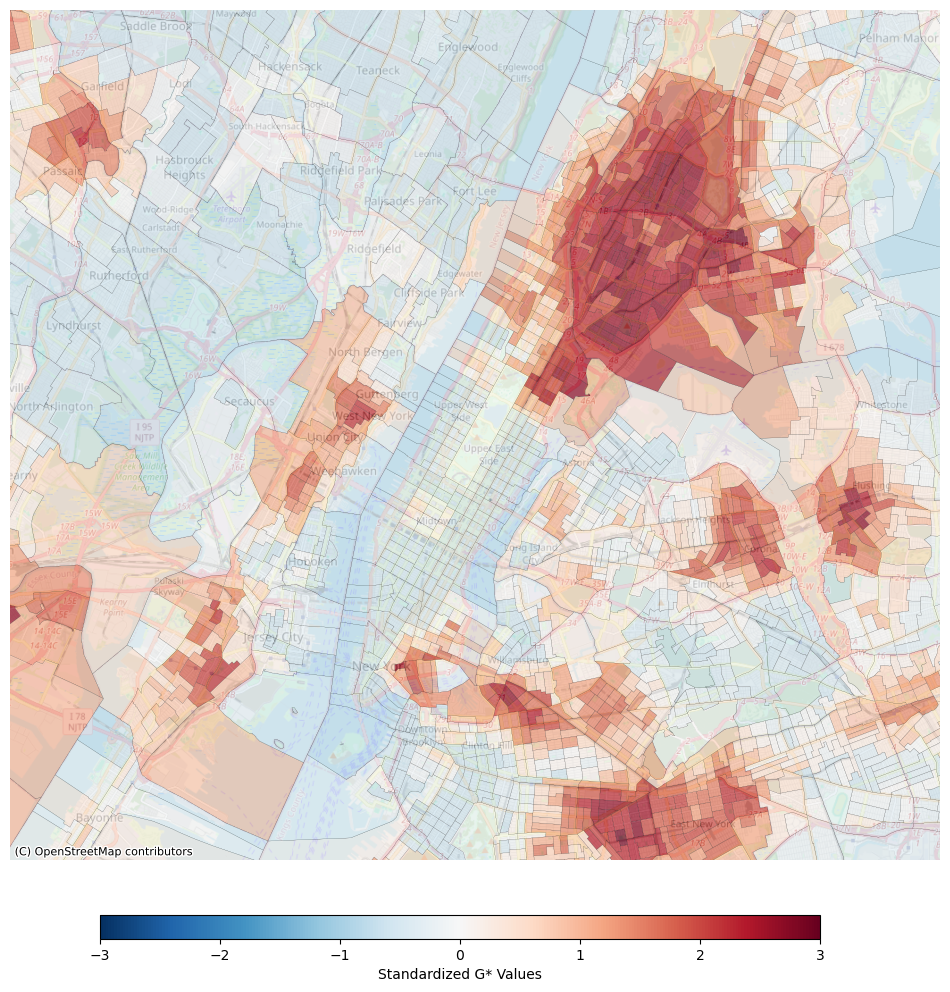

Data CRS: EPSG:3857
Original bounding box (WGS84): (-74.3, 40.5, -73.65, 40.95)
Zoomed to Manhattan at: -8234302.733978447, 4979945.670525387


In [40]:
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib.cm as cm
from matplotlib.colorbar import ColorbarBase
import numpy as np
from shapely.geometry import box
import contextily as ctx
from pyproj import Transformer

# Assuming national_results is your DataFrame
# If this code is in a separate script, you'll need to load your data first
# national_results = gpd.read_file('path_to_your_data.geojson')

# Define a bounding box for New York City
# Approximate coordinates for NYC metro area (min_x, min_y, max_x, max_y)
area_bounds = (-74.30, 40.50, -73.65, 40.95)

# Create a geometric box from the bounds
bbox = box(area_bounds[0], area_bounds[1], area_bounds[2], area_bounds[3])

# Make sure the CRS is correct before spatial operations
if national_results.crs is None:
    print("Warning: CRS is not defined. Assuming WGS84.")
    national_results.crs = "EPSG:4326"
elif national_results.crs.to_epsg() != 4326:
    national_results = national_results.to_crs(epsg=4326)

# Create a GeoDataFrame for the bounding box with the same CRS
bbox_gdf = gpd.GeoDataFrame({'geometry': [bbox]}, crs="EPSG:4326")

# Filter to include any tract that intersects with the bounding box
# This includes tracts that are only partially within the bounds
area_of_interest = national_results[national_results.intersects(bbox.boundary) | 
                                   national_results.within(bbox)].copy()

print(f"Number of census tracts in/intersecting area: {len(area_of_interest)}")

# Convert to Web Mercator for consistent mapping
area_of_interest_webmerc = area_of_interest.to_crs(epsg=3857)
bbox_webmerc = bbox_gdf.to_crs(epsg=3857)

# Define Manhattan coordinates (approximate center of NYC)
# Manhattan is roughly at (-73.97, 40.78) in WGS84
manhattan_wgs84 = (-73.97, 40.78)
# Convert to Web Mercator
transformer = Transformer.from_crs("EPSG:4326", "EPSG:3857", always_xy=True)
manhattan_x, manhattan_y = transformer.transform(manhattan_wgs84[0], manhattan_wgs84[1])

# Create a figure with a specific size - no constrained layout
fig, ax = plt.subplots(1, 1, figsize=(12, 12))

# Set up a diverging colormap with fixed range from -3 to 3
vmin = -3
vmax = 3
norm = colors.Normalize(vmin=vmin, vmax=vmax)
cmap = cm.RdBu_r  # Red-Blue diverging colormap, reversed

# Plot the data
area_of_interest_webmerc.plot(
    column='standardized_g_star',
    cmap=cmap,
    norm=norm,
    linewidth=0.1,  # Thin black borders
    edgecolor='black',
    alpha=0.7,  # Add transparency to see the basemap beneath
    ax=ax
)

# Plot the bounding box as a reference (optional)
bbox_webmerc.boundary.plot(ax=ax, color='red', linewidth=1)

# Calculate zoom extent
bbox_bounds = bbox_webmerc.total_bounds
x_range = bbox_bounds[2] - bbox_bounds[0]
y_range = bbox_bounds[3] - bbox_bounds[1]

# Set the extent to zoomed in around Manhattan
zoom_factor = 0.55  # 55% zoom
ax.set_xlim(manhattan_x - x_range * zoom_factor / 2, manhattan_x + x_range * zoom_factor / 2)
ax.set_ylim(manhattan_y - y_range * zoom_factor / 2, manhattan_y + y_range * zoom_factor / 2)

# Add the basemap back
try:
    ctx.add_basemap(
        ax, 
        source=ctx.providers.OpenStreetMap.Mapnik,
        zoom=12  # Higher zoom level for Manhattan area
    )
    print("Basemap added successfully")
except Exception as e:
    print(f"Error adding basemap: {e}")
    # Fallback to another tile provider
    try:
        ctx.add_basemap(
            ax,
            source=ctx.providers.Stamen.TonerLite,
            zoom=12
        )
        print("Fallback basemap added")
    except Exception as e2:
        print(f"Error adding fallback basemap: {e2}")

# Remove axes
ax.set_axis_off()

# Adjust figure margins to minimize whitespace
plt.subplots_adjust(bottom=0.13, top=0.99)

# Add a horizontal colorbar directly below the map with minimal gap
# Position parameters: [left, bottom, width, height]
cbar_ax = fig.add_axes([0.2, 0.14, 0.6, 0.02])  # Positioned just below the map
ColorbarBase(
    cbar_ax, 
    cmap=cmap,
    norm=norm,
    orientation='horizontal',
    label='Standardized G* Values'
)

# Save the figure with tight bounding box
plt.savefig('img/nyc_standardized_g_star_map.png', dpi=300, bbox_inches='tight')

# Show the plot
plt.show()

# Diagnostic information
print(f"Data CRS: {area_of_interest_webmerc.crs}")
print(f"Original bounding box (WGS84): {area_bounds}")
print(f"Zoomed to Manhattan at: {manhattan_x}, {manhattan_y}")